<img src="https://i.pinimg.com/474x/8f/33/eb/8f33eb8e6f1b9365eb967e614eca749d.jpg" width="200" height="150">

# **Bayer 04 Leverkusen's Bundesliga 2023/24 Season Analysis ⚽**

🎯 **Objective**: Analyze Bayer Leverkusen’s unbeaten run in the Bundesliga 2023/24 season through StatsBomb event data.

🔍 **Key Focus Areas**:
- Dominance in possession
- Defensive solidity and pressing
- Passing networks and attacking buildup
- Player-wise involvement (Wirtz, Grimaldo, Boniface)

📊 **Tools Used**:  
`pandas`, `mplsoccer`, `statsbombpy`, `matplotlib`, `seaborn`, `networkx`

👨‍💻 **Author**: Rishiraj Sinharay


In [1]:
# Installing libraries
! pip install mplsoccer --quiet
! pip install statsbombpy --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.8/85.8 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 3.1 MB/s eta 0:00:00


In [2]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
from collections import defaultdict
from collections import Counter
import networkx as nx
from statsbombpy import sb
from mplsoccer import Pitch, VerticalPitch, Radar, FontManager
from collections import defaultdict

In [3]:
free_comps = sb.competitions()

In [4]:
free_comps[free_comps['competition_name']=='1. Bundesliga']

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
0,9,281,Germany,1. Bundesliga,male,False,False,2023/2024,2024-07-15T14:15:54.671676,2024-07-15T14:17:00.877356,2024-07-15T14:17:00.877356,2024-07-15T14:15:54.671676
1,9,27,Germany,1. Bundesliga,male,False,False,2015/2016,2024-05-19T11:11:14.192381,None,None,2024-05-19T11:11:14.192381


Bayern Leverkusen's winning season has `competition_id = 9` and `season_id = 281`

In [5]:
matches = sb.matches(competition_id=9, season_id=281)

In [6]:
# Filtering Bayer Leverkusen's matches
bl_matches = matches[(matches['home_team']=='Bayer Leverkusen') | (matches['away_team']=='Bayer Leverkusen')]

In [7]:
bl_matches.head()

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
0,3895302,2024-04-14,17:30:00.000,Germany - 1. Bundesliga,2023/2024,Bayer Leverkusen,Werder Bremen,5,0,available,...,2024-05-10T17:03:59.613154,29,Regular Season,BayArena,Harm Osmers,Xabier Alonso Olano,Ole Werner,1.1.0,2,2
1,3895292,2024-04-06,15:30:00.000,Germany - 1. Bundesliga,2023/2024,Union Berlin,Bayer Leverkusen,0,1,available,...,2024-05-12T21:08:37.897296,28,Regular Season,Stadion An der Alten Försterei,Benjamin Brand,Nenad Bjelica,Xabier Alonso Olano,1.1.0,2,2
2,3895333,2024-05-05,18:30:00.000,Germany - 1. Bundesliga,2023/2024,Eintracht Frankfurt,Bayer Leverkusen,1,5,available,...,2024-05-14T16:32:13.483516,32,Regular Season,Deutsche Bank Park,Christian Dingert,Dino Toppmöller,Xabier Alonso Olano,1.1.0,2,2
3,3895340,2024-05-12,20:30:00.000,Germany - 1. Bundesliga,2023/2024,Bochum,Bayer Leverkusen,0,5,available,...,2024-05-14T16:46:08.459843,33,Regular Season,Vonovia Ruhrstadion,Benjamin Brand,Heiko Butscher,Xabier Alonso Olano,1.1.0,2,2
4,3895348,2024-05-18,16:30:00.000,Germany - 1. Bundesliga,2023/2024,Bayer Leverkusen,Augsburg,2,1,available,...,2024-05-20T10:33:09.140760,34,Regular Season,BayArena,Matthias Jöllenbeck,Xabier Alonso Olano,Jess Christian Thorup,1.1.0,2,2


In [8]:
bl_matches.columns

Index(['match_id', 'match_date', 'kick_off', 'competition', 'season',
       'home_team', 'away_team', 'home_score', 'away_score', 'match_status',
       'match_status_360', 'last_updated', 'last_updated_360', 'match_week',
       'competition_stage', 'stadium', 'referee', 'home_managers',
       'away_managers', 'data_version', 'shot_fidelity_version',
       'xy_fidelity_version'],
      dtype='object')

## 1. ⚙️ Basic Stats Overview

A general summary of Bayer Leverkusen’s team performance in terms of goals scored, goals conceded, win/draw/loss ratio, and average possession.

### 1.1. Won/Lost/Drawn

In [9]:
# Total number of games played by Leverkusen
total_matches = bl_matches.shape[0]

In [10]:
# Wins
wins = bl_matches.apply(lambda x: (
    (x['home_score'] > x['away_score'] and x['home_team'] == "Bayer Leverkusen") or
    (x['away_score'] > x['home_score'] and x['away_team'] == "Bayer Leverkusen")
), axis=1).sum()

# Draws
draws = bl_matches.apply(lambda x: x['home_score'] == x['away_score'], axis=1).sum()
# Losses
losses = total_matches - wins - draws

# Points
points = wins*3+draws

In [11]:
print('Total matches:', total_matches, ', Wins:',wins,', Losses:', losses,', Draws:', draws, ', Points:', points)

Total matches: 34 , Wins: 28 , Losses: 0 , Draws: 6 , Points: 90


### 1.2. Goals scored/conceded

In [12]:
# Total goals scored in the league
goals_scored = bl_matches.apply(lambda x: x['home_score'] if x['home_team'] == "Bayer Leverkusen" else x['away_score'], axis=1).sum()
# Total goals conceded in the league
goals_conceded = bl_matches.apply(lambda x: x['away_score'] if x['home_team'] == "Bayer Leverkusen" else x['home_score'], axis=1).sum()
# Goal difference
goal_difference = goals_scored - goals_conceded

In [13]:
print('Goals scored:',goals_scored,', Goals conceded:', goals_conceded,', Goal difference:', goal_difference)

Goals scored: 89 , Goals conceded: 24 , Goal difference: 65


### 1.3. Clean Sheets

In [14]:
# Calculating number of clean sheets
clean_sheets = 0

for index, row in bl_matches.iterrows():
    if row['home_team'] == 'Bayer Leverkusen':
        if row['away_score'] == 0:
            clean_sheets += 1
    elif row['away_team'] == 'Bayer Leverkusen':
        if row['home_score'] == 0:
            clean_sheets += 1

In [15]:
print('Number of clean sheets:', clean_sheets)

Number of clean sheets: 16


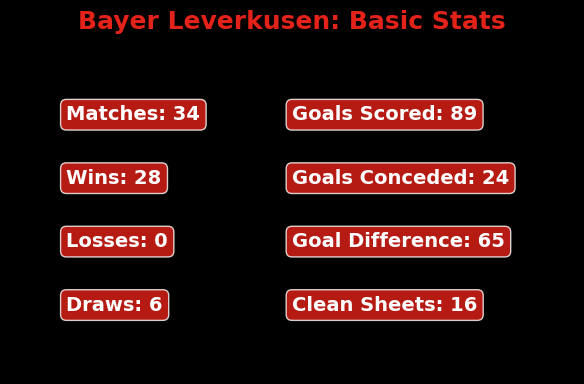

In [55]:
# Bayer Leverkusen colors
red = "#E32219"
black = "#000000"
white = "#ffffff"

# Create figure with black background
fig, ax = plt.subplots(figsize=(6, 4))
fig.patch.set_facecolor(black)
ax.set_facecolor(black)
ax.axis('off')  # Hide axes

# Text items and their positions
text_items = [
    ("Matches", total_matches),
    ("Wins", wins),
    ("Losses", losses),
    ("Draws", draws),
    ("Goals Scored", goals_scored),
    ("Goals Conceded", goals_conceded),
    ("Goal Difference", goal_difference),
    ("Clean Sheets", clean_sheets)
]

# X and Y positions in Axes coordinates
x_pos = [0.1,0.1, 0.1, 0.1, 0.5, 0.5, 0.5, 0.5]
y_pos = [0.8, 0.6, 0.4, 0.2, 0.8, 0.6, 0.4, 0.2]

# Draw each text item
for i, (label, value) in enumerate(text_items):
    ax.text(x_pos[i], y_pos[i],
            f"{label}: {value}",
            fontsize=14,
            color=white,
            fontweight='bold',
            transform=ax.transAxes,
            bbox=dict(facecolor=red, alpha=0.8, boxstyle="round,pad=0.3"))

# Title with Bayer style
ax.set_title("Bayer Leverkusen: Basic Stats", fontsize=18, color=red, weight='bold', pad=20)

# Show plot
plt.tight_layout()
plt.show()


## 2. 🧠 Tactical Formation Analysis

<img src="https://i.pinimg.com/474x/2b/e6/6d/2be66d2907e99c4aa0b136e7147c4c3f.jpg" width="210" height="210">

### 2.1. Formations

Goals For and Against by Formation:
Visualizes the effectiveness of formations like 3412, 3421, 3511, etc. in both scoring and defending.

Result Breakdown by Formation:
Shows wins, draws, and losses corresponding to each formation used throughout the season.

In [17]:
from collections import defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Color palette
bayer_red = "#E32219"
bayer_black = "#000000"
bayer_gray = "#9DA0A0"

# ---------- 1. Initialize ----------
formation_stats = defaultdict(lambda: {
    'matches': 0, 'goals_for': 0, 'goals_against': 0,
    'wins': 0, 'draws': 0, 'losses': 0
})

formation_minute_stats = defaultdict(lambda: defaultdict(lambda: {
    'goals_for': 0, 'goals_against': 0,
    'shots_for': 0, 'shots_against': 0
}))

# Loop through each match
for _, match in bl_matches.iterrows():
    match_id = match['match_id']
    events = sb.events(match_id=match_id)

    # Get all tactical events for formations of Bayer Leverkusen
    starting_11 = events[(events['type'] == 'Starting XI') & (events['team'] == 'Bayer Leverkusen')]
    tactical_changes = events[(events['type'] == 'Tactical Shift') & (events['team'] == 'Bayer Leverkusen')]

    # Build formation timeline
    formation_timeline = []
    if not starting_11.empty:
        formation_timeline.append({'formation': starting_11.iloc[0]['tactics']['formation'], 'minute': 0})
    for _, row in tactical_changes.iterrows():
        formation_timeline.append({'formation': row['tactics']['formation'], 'minute': row['minute']})
    formation_timeline = sorted(formation_timeline, key=lambda x: x['minute'])
    for i in range(len(formation_timeline)):
        formation_timeline[i]['end_minute'] = formation_timeline[i+1]['minute'] if i < len(formation_timeline)-1 else 91

    # Process shots and goals
    shots = events[events['type'] == 'Shot']
    for _, shot in shots.iterrows():
        mnt = shot['minute']
        is_goal = shot.get('shot_outcome') == 'Goal'
        team = shot['team']
        for seg in formation_timeline:
            if seg['minute'] <= mnt < seg['end_minute']:
                f = seg['formation']
                if team == 'Bayer Leverkusen':
                    formation_minute_stats[f][mnt]['shots_for'] += 1
                    if is_goal:
                        formation_minute_stats[f][mnt]['goals_for'] += 1
                        formation_stats[f]['goals_for'] += 1
                else:
                    formation_minute_stats[f][mnt]['shots_against'] += 1
                    if is_goal:
                        formation_minute_stats[f][mnt]['goals_against'] += 1
                        formation_stats[f]['goals_against'] += 1
                break

    # Match result using final formation
    final_formation = formation_timeline[-1]['formation']
    formation_stats[final_formation]['matches'] += 1
    leverkusen_home = match['home_team'] == 'Bayer Leverkusen'
    gf = match['home_score'] if leverkusen_home else match['away_score']
    ga = match['away_score'] if leverkusen_home else match['home_score']

    if gf > ga:
        formation_stats[final_formation]['wins'] += 1
    elif gf < ga:
        formation_stats[final_formation]['losses'] += 1
    else:
        formation_stats[final_formation]['draws'] += 1

# ---------- 3. Convert to DataFrames ----------
formation_df = pd.DataFrame.from_dict(formation_stats, orient='index').reset_index()
formation_df = formation_df.rename(columns={'index': 'Formation'})
formation_df = formation_df.sort_values(by='matches', ascending=False)

timeline_rows = []
for formation, minute_dict in formation_minute_stats.items():
    for minute in range(91):
        stats = minute_dict.get(minute, {})
        timeline_rows.append({
            'formation': formation,
            'minute': minute,
            'shots_for': stats.get('shots_for', 0),
            'goals_for': stats.get('goals_for', 0),
            'shots_against': stats.get('shots_against', 0),
            'goals_against': stats.get('goals_against', 0),
        })
timeline_df = pd.DataFrame(timeline_rows)

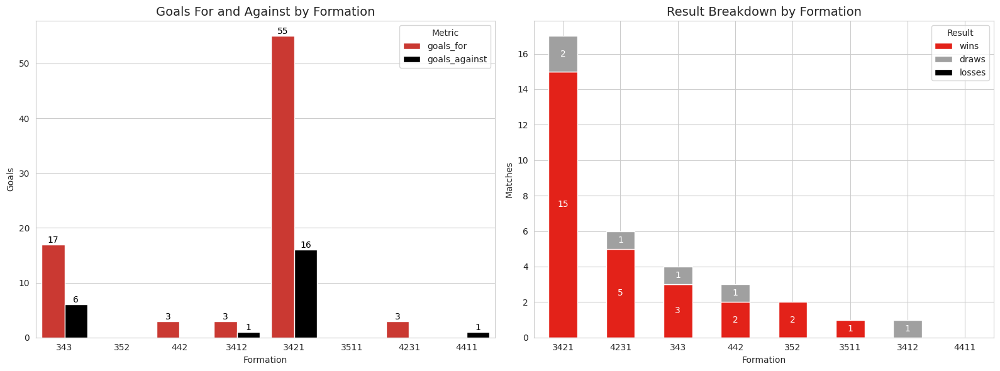

In [18]:
# Set Seaborn style and Bayer Leverkusen colors
sns.set_style("whitegrid")
colors = {
    'goals_for': '#E32219',  # Red
    'goals_against': '#000000',  # Black
    'wins': '#E32219',
    'draws': '#A0A0A0',
    'losses': '#000000'
}

# Top 2 formations
top2 = formation_df

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- Plot 1: Goals For and Against ---
bar1 = sns.barplot(
    data=top2.melt(id_vars='Formation', value_vars=['goals_for', 'goals_against']),
    x='Formation', y='value', hue='variable', ax=axes[0],
    palette=[colors['goals_for'], colors['goals_against']]
)
axes[0].set_title("Goals For and Against by Formation", fontsize=14)
axes[0].set_ylabel("Goals")
axes[0].legend(title='Metric')

# Add value labels
for p in bar1.patches:
    height = p.get_height()
    if height > 0:
        bar1.annotate(f'{int(height)}',
                      (p.get_x() + p.get_width() / 2., height),
                      ha='center', va='bottom', fontsize=10, color='black')

# --- Plot 2: Match Results Breakdown ---
top2_results = top2.set_index('Formation')[['wins', 'draws', 'losses']]
top2_results.plot(
    kind='bar', stacked=True, ax=axes[1],
    color=[colors['wins'], colors['draws'], colors['losses']]
)
axes[1].set_title("Result Breakdown by Formation", fontsize=14)
axes[1].set_ylabel("Matches")
axes[1].set_xticklabels(top2['Formation'], rotation=0)
axes[1].legend(title="Result")

# Add labels to stacked bars
for container in axes[1].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            axes[1].annotate(f'{int(height)}',
                             (bar.get_x() + bar.get_width() / 2., bar.get_y() + height / 2),
                             ha='center', va='center', fontsize=10, color='white')

plt.tight_layout()
plt.show()


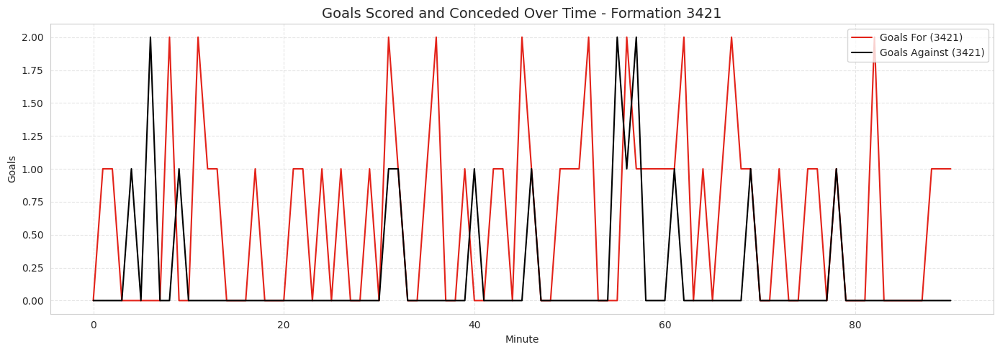

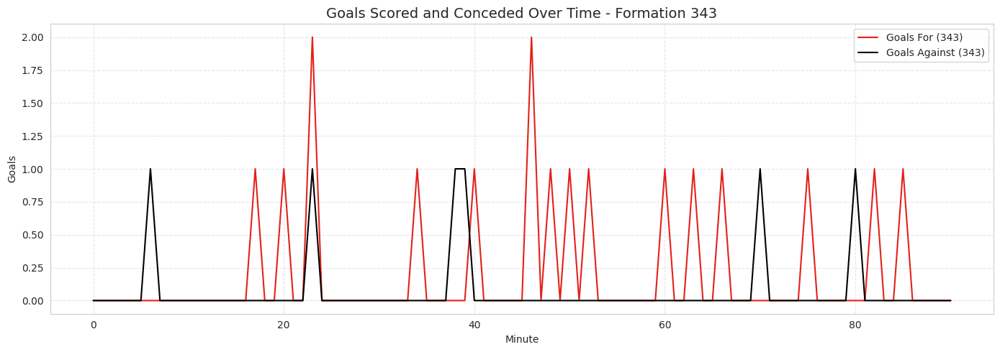

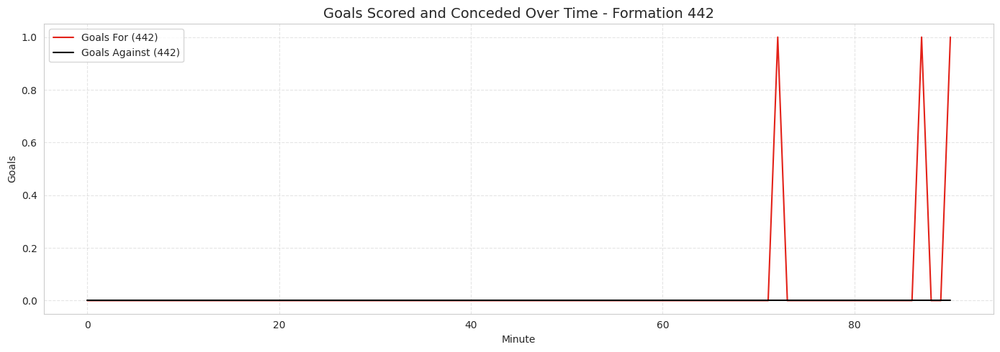

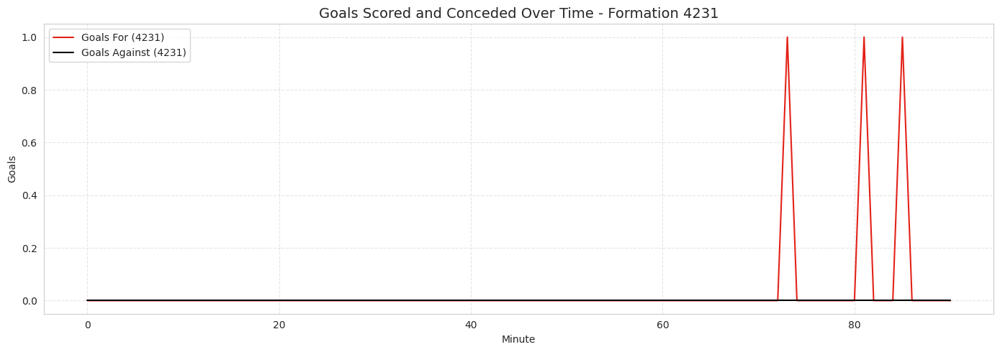

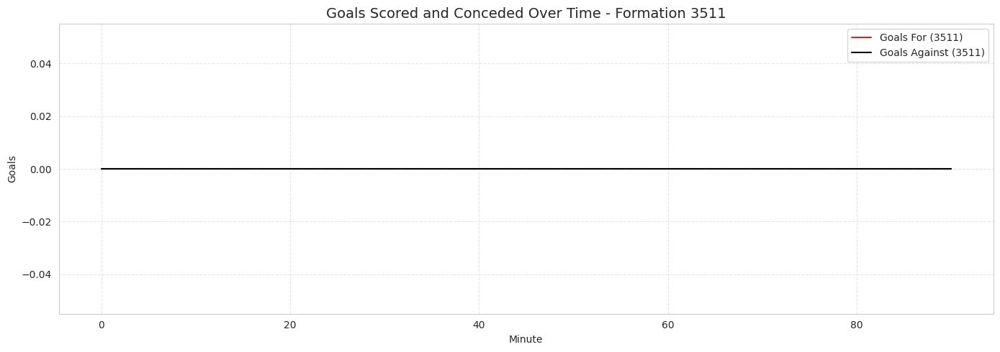

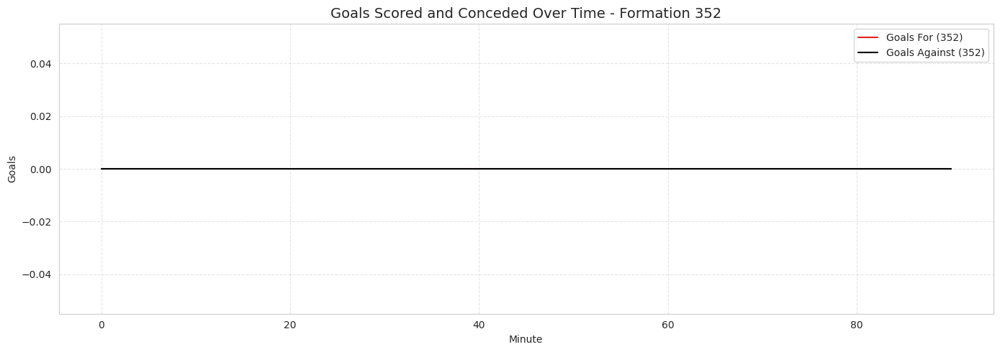

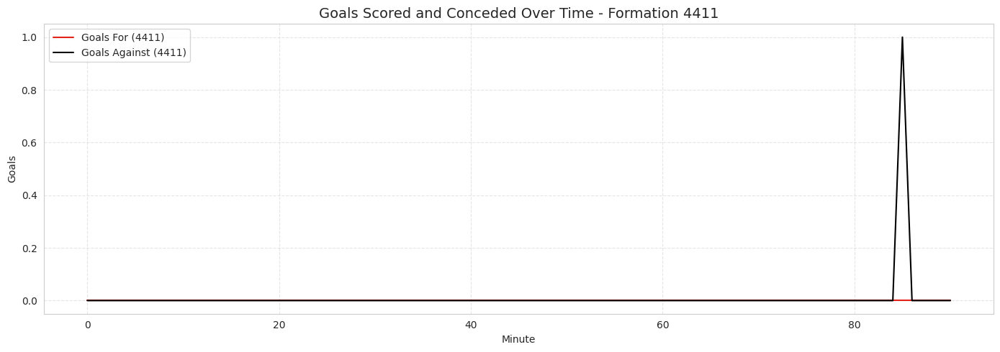

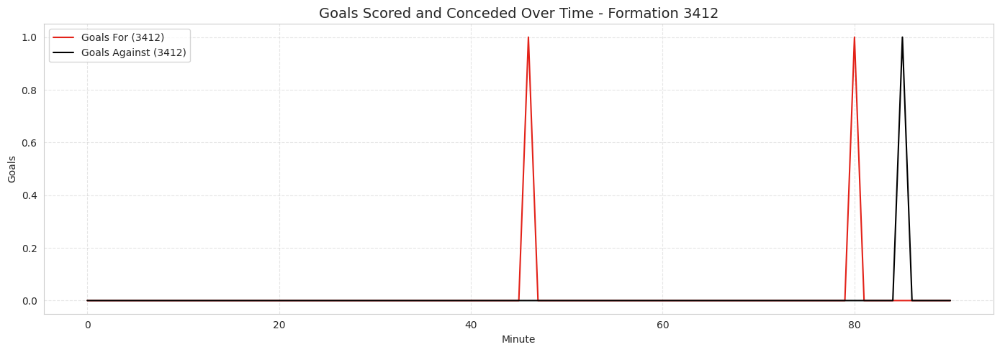

In [19]:
# Get unique formations
formations = timeline_df['formation'].unique()

# Plot for each formation
for f in formations:
    subset = timeline_df[timeline_df['formation'] == f]

    plt.figure(figsize=(14, 5))
    sns.lineplot(data=subset, x='minute', y='goals_for', label=f'Goals For ({f})', color=bayer_red)
    sns.lineplot(data=subset, x='minute', y='goals_against', label=f'Goals Against ({f})', color=bayer_black)

    plt.title(f'Goals Scored and Conceded Over Time - Formation {f}', fontsize=14)
    plt.xlabel('Minute')
    plt.ylabel('Goals')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

### 2.2. Build Up Play Leading to Shots/Goals

In [20]:
example_event = sb.events(match_id = bl_matches['match_id'][0])

In [21]:
bl_events = pd.DataFrame(columns = example_event.columns )
for _, match in bl_matches.iterrows():
    match_id = match['match_id']
    # Extract all match events
    events = sb.events(match_id=match_id)
    # Filter out Bayer Leverkusen events in Regular play
    bl_events = pd.concat([bl_events,events[(events['team'] == 'Bayer Leverkusen') & (events['play_pattern'] == 'Regular Play')]], ignore_index=True)


<ipython-input-21-adbf92c7f2ad>:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bl_events = pd.concat([bl_events,events[(events['team'] == 'Bayer Leverkusen') & (events['play_pattern'] == 'Regular Play')]], ignore_index=True)


In [22]:
# storing all passes and carries for build-up
passes = bl_events[bl_events['type'] == 'Pass'].copy()
carries = bl_events[bl_events['type'] == 'Carry'].copy()

In [23]:
# Segmenting by Role (Def, Mid, Fwd)

# Defining a function to classify positions into 3 segments
def get_position_group(pos):
  if 'Back' in pos or 'Goalkeeper' in pos:
    return 'Defender'
  elif 'Midfield' in pos:
    return 'Midfielder'
  else:
    return 'Forward'


In [24]:
# Classify positions
passes['role'] = passes['position'].apply(get_position_group)
carries['role'] = carries['position'].apply(get_position_group)

#### ***2.2.1 Passing Networks***

In [25]:
# Passing networks
# Defining a function to plot passing network according to role entered

def plot_passing_network(role):
    position_passes = passes[passes['role'] == role]

    # Get average location of each player
    avg_positions = position_passes.groupby('player')['location'].apply(lambda x: np.mean(x.tolist(), axis=0))

    # Count passes between players
    pass_pairs = position_passes[['player', 'pass_recipient']].dropna()
    pass_combos = Counter([tuple(x) for x in pass_pairs.values])

    # Count touches (passes + receptions)
    touches = Counter(pass_pairs['player']) + Counter(pass_pairs['pass_recipient'])

    # Plot network
    pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)
    fig, ax = pitch.draw(figsize=(18, 10))
    ax.set_title(f'{role}s Passing Network – Bayer Leverkusen', color='black', fontsize=16)

    # Plot players with size scaled by touches
    for player, pos in avg_positions.items():
        touch_count = touches[player]
        marker_size = 50 + 6 * touch_count  # Size of circles
        pitch.scatter(pos[0], pos[1], s=marker_size, color='#D00027', edgecolors='white', linewidth=2, ax=ax, zorder=3)
        ax.text(pos[0], pos[1], player.split()[-1], ha='center', va='top', fontsize=10 + marker_size/800, color='white', zorder=4)

    # Plot directional arrows for passes
    for (p1, p2), count in pass_combos.items():
        if p1 in avg_positions and p2 in avg_positions and count >= 2:
            start = avg_positions[p1]
            end = avg_positions[p2]
            dx = end[0] - start[0]
            dy = end[1] - start[1]

            # Subtle white base arrow
            pitch.arrows(start[0], start[1], start[0] + dx, start[1] + dy,
                         width=(count / 4), headwidth=10, headlength=10, headaxislength=5,
                         color='white', alpha=0.2, ax=ax, zorder=2)

            # Foreground arrow with transparency scaling
            pitch.arrows(start[0], start[1], end[0], end[1],
                         width=2, headwidth=5, headlength=5, headaxislength=3.5,
                         color='black', alpha=0.5 + 0.5 * (min(count, 10) / 10), ax=ax, zorder=2)

    plt.show()

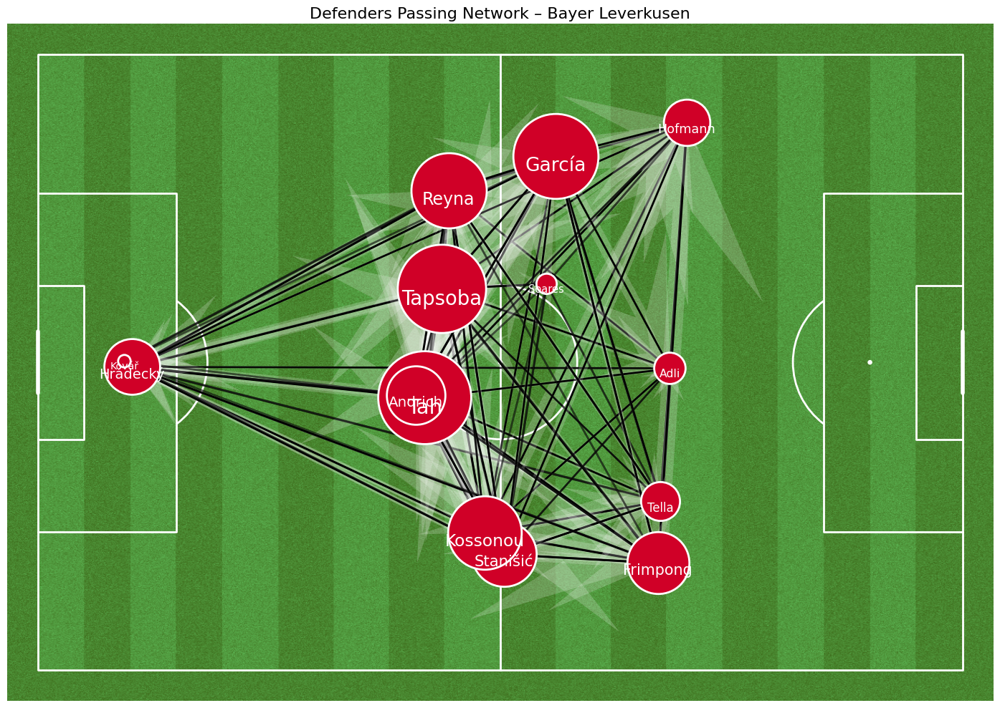

In [26]:
# Plotting Defenders
plot_passing_network('Defender')

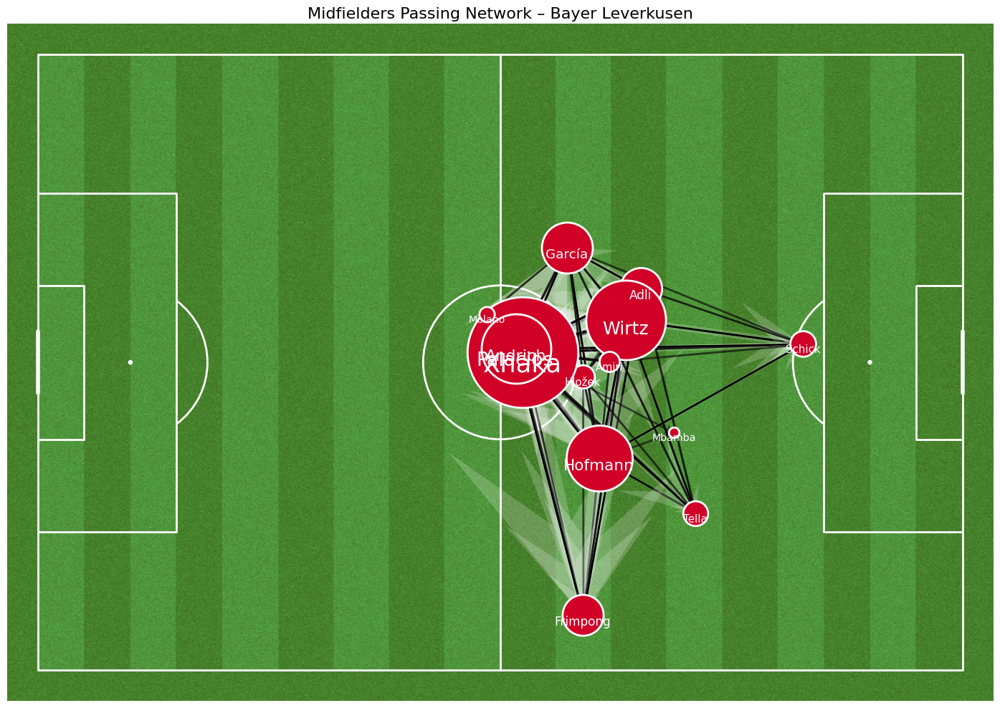

In [27]:
# Plotting Midfielders
plot_passing_network('Midfielder')

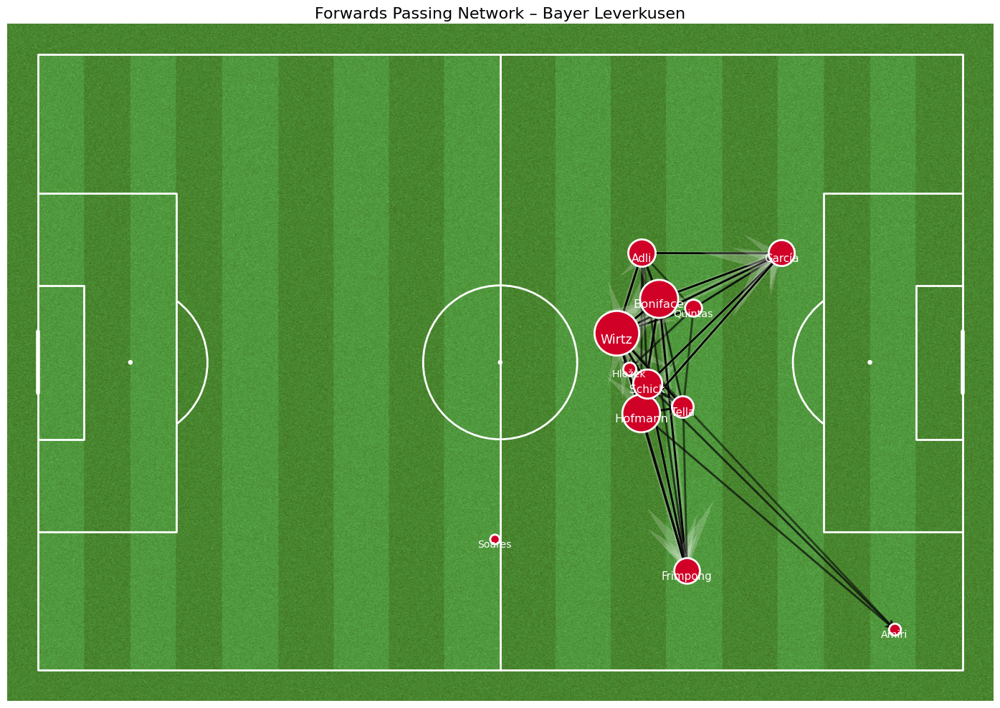

In [28]:
# Plotting Forwards
plot_passing_network('Forward')

#### ***2.2.2. Average Position Maps***

Visualizes the average position on the pitch for each player by role (Defender, Midfielder, Forward), aiding in understanding team structure and shape during matches.

In [29]:
# Combine passes and carries
movement_df = pd.concat([passes, carries])

# Drop rows with missing data
movement_df = movement_df.dropna(subset=['player','location', 'position'])

# Calculate average location for each player + role
avg_positions = movement_df.groupby(['player', 'role'])['location'].apply(lambda x: np.mean(x.tolist(), axis=0)).reset_index()
avg_positions[['x', 'y']] = pd.DataFrame(avg_positions['location'].tolist(), index=avg_positions.index)


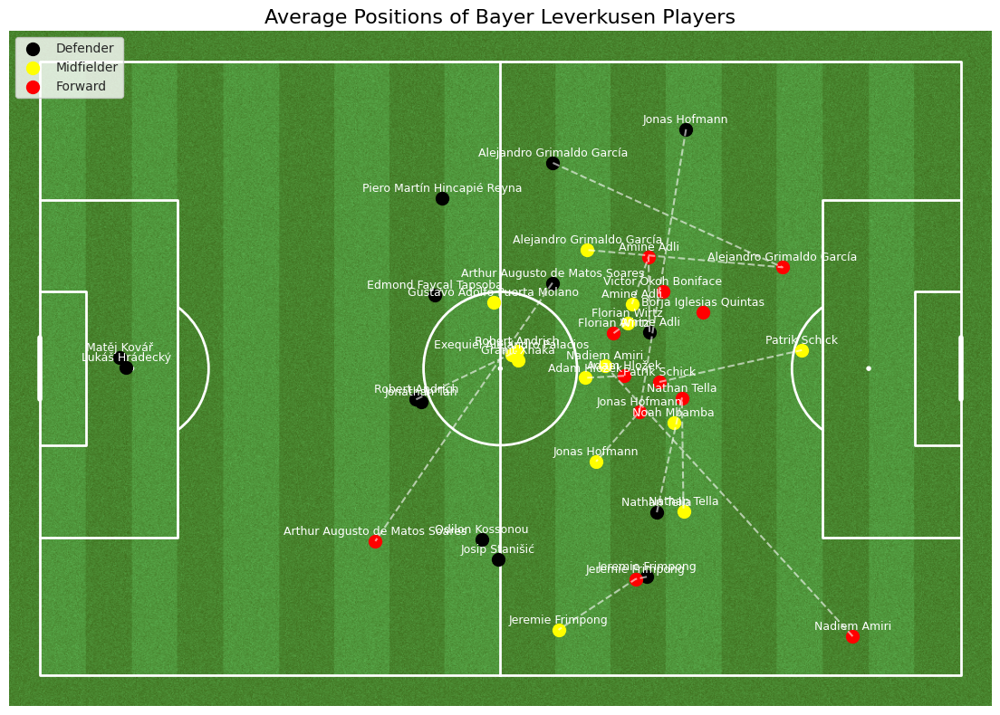

In [30]:
# plot average positions by role
role_colors = {
    'Defender': 'black',
    'Midfielder': 'yellow',
    'Forward': 'red'
}

pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)
fig, ax = pitch.draw(figsize=(16, 8))

for role in ['Defender', 'Midfielder', 'Forward']:
    data = avg_positions[avg_positions['role'] == role]
    pitch.scatter(data['x'], data['y'], color=role_colors[role],s=100, ax=ax, label=role)
    for _, row in data.iterrows():
        ax.text(row['x'], row['y'] - 2, row['player'], color='white', fontsize=9, ha='center', va='top')

# Connect same player across different roles


# Group by player to find duplicates
player_role_positions = defaultdict(list)

for _, row in avg_positions.iterrows():
    player_role_positions[row['player']].append((row['x'], row['y']))

# Draw transparent lines between role positions for same player
for player, coords in player_role_positions.items():
    if len(coords) > 1:
        coords = np.array(coords)
        ax.plot(coords[:, 0], coords[:, 1], color='white', alpha=0.6, linewidth=1.5, linestyle='--')

plt.title('Average Positions of Bayer Leverkusen Players', fontsize=16, color='black')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

### ***2.2.3. Heatmaps (Touches/Carries/Pass Starts)***

Defenders, Midfielders, and Forwards Heatmaps:
Highlights the areas of the pitch most occupied and influenced by players in each position group.

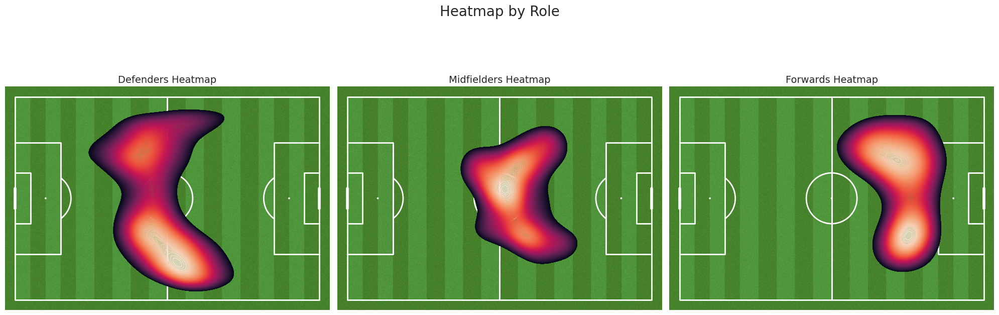

In [31]:
# Set Bayer Leverkusen color map (red-black gradient style)
cmap = 'rocket'


# Initialize pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass',stripe = True, line_color='white')
fig, axes = pitch.draw(nrows=1, ncols=3, figsize=(20, 7))
roles = ['Defender', 'Midfielder', 'Forward']

# Plot for each role
for ax, role in zip(axes.flat, roles):
    # Pass + Carry locations
    pass_locs = passes[passes['role'] == role]['location'].dropna().tolist()
    carry_locs = carries[carries['role'] == role]['location'].dropna().tolist()
    all_locs = np.array(pass_locs + carry_locs)

    if len(all_locs) > 0:
        sns.kdeplot(
            x=all_locs[:, 0],
            y=all_locs[:, 1],
            fill=True,
            cmap=cmap,
            alpha=0.8,
            bw_adjust=1.2,
            ax=ax,
            levels=200,
            thresh=0.6
        )

    ax.set_title(f'{role}s Heatmap', fontsize=14)

plt.suptitle("Heatmap by Role", fontsize=20, y=1.02)

plt.tight_layout()
plt.show()

## 3. 🔁 Possession Trends

Minute-by-minute possession breakdown comparing overall, home, and away matches.

In [32]:
# Set color palette
sns.set(style="whitegrid")

# Dict: {minute: {'overall': [counts], 'home': [counts], 'away': [counts]}}
possession_minute_split = defaultdict(lambda: {
    'total': 0, 'leverkusen': 0,
    'home_total': 0, 'home_leverkusen': 0,
    'away_total': 0, 'away_leverkusen': 0
})

for _, match in bl_matches.iterrows():
    match_id = match['match_id']
    events = sb.events(match_id=match_id)

    leverkusen_home = match['home_team'] == 'Bayer Leverkusen'

    for _, row in events.iterrows():
        minute = row['minute']
        team = row['possession_team']

        possession_minute_split[minute]['total'] += 1
        if team == 'Bayer Leverkusen':
            possession_minute_split[minute]['leverkusen'] += 1

        if leverkusen_home:
            possession_minute_split[minute]['home_total'] += 1
            if team == 'Bayer Leverkusen':
                possession_minute_split[minute]['home_leverkusen'] += 1
        else:
            possession_minute_split[minute]['away_total'] += 1
            if team == 'Bayer Leverkusen':
                possession_minute_split[minute]['away_leverkusen'] += 1

# Build DataFrame
possession_split_stats = []

for minute in range(91):
    data = possession_minute_split[minute]

    def pct(part, total):
        return (part / total) * 100 if total > 0 else 0

    possession_split_stats.append({
        'minute': minute,
        'overall_pct': pct(data['leverkusen'], data['total']),
        'home_pct': pct(data['home_leverkusen'], data['home_total']),
        'away_pct': pct(data['away_leverkusen'], data['away_total']),
    })

possession_split_df = pd.DataFrame(possession_split_stats)

# Compute full-match average
avg_total_possession = possession_split_df['overall_pct'].mean()

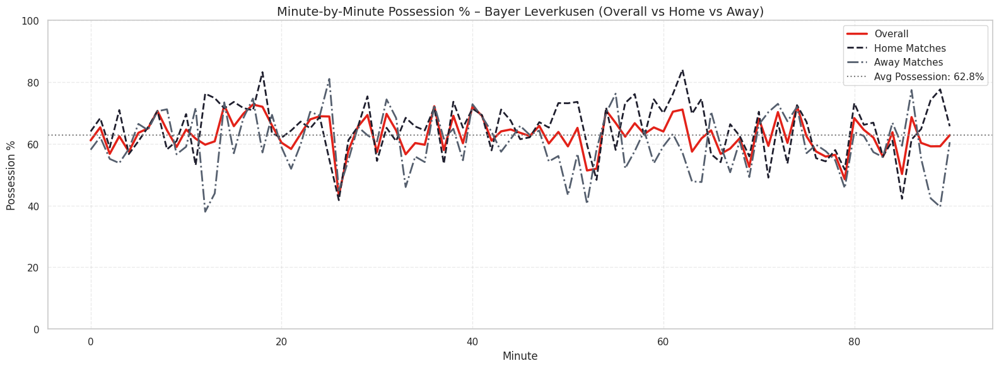

In [33]:
# Plotting
plt.figure(figsize=(16, 6))

# Line plots
sns.lineplot(data=possession_split_df, x='minute', y='overall_pct', label='Overall', color='#E32219', linewidth=2.5)
sns.lineplot(data=possession_split_df, x='minute', y='home_pct', label='Home Matches', color='#1F1F2E', linestyle='--', linewidth=2)
sns.lineplot(data=possession_split_df, x='minute', y='away_pct', label='Away Matches', color='#555F6E', linestyle='-.', linewidth=2)

# Add average line
plt.axhline(y=avg_total_possession, color='gray', linestyle=':', label=f'Avg Possession: {avg_total_possession:.1f}%', linewidth=1.5)

# Labels and style
plt.title("Minute-by-Minute Possession % – Bayer Leverkusen (Overall vs Home vs Away)", fontsize=14)
plt.xlabel("Minute")
plt.ylabel("Possession %")
plt.ylim(0, 100)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

In [34]:
# Init counters
thirds_counter = {
    'defensive': 0,
    'middle': 0,
    'attacking': 0,
    'total': 0
}

for _, match in bl_matches.iterrows():
    match_id = match['match_id']
    events = sb.events(match_id=match_id)

    for _, event in events.iterrows():
        if event['possession_team'] == 'Bayer Leverkusen' and isinstance(event['location'], list):
            x = event['location'][0]

            if x < 33.3:
                thirds_counter['defensive'] += 1
            elif x < 66.6:
                thirds_counter['middle'] += 1
            else:
                thirds_counter['attacking'] += 1

            thirds_counter['total'] += 1

# Calculate possession %
def pct(part):
  # compute percentage to avoid division by zero if total is 0
  return (part / thirds_counter['total']) * 100 if thirds_counter['total'] else 0

def_pct = pct(thirds_counter['defensive'])
mid_pct = pct(thirds_counter['middle'])
att_pct = pct(thirds_counter['attacking'])


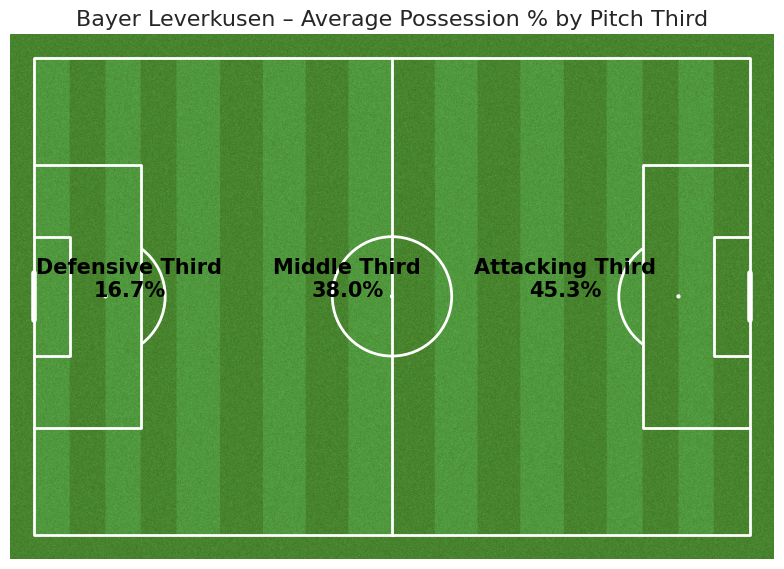

In [57]:
# Plotting
pitch = Pitch(pitch_type='statsbomb', line_color='white', pitch_color='grass', stripe= True)
fig, ax = pitch.draw(figsize=(8, 6))

# Annotate percentages
pitch.annotate(f'Defensive Third\n{def_pct:.1f}%', xy=(16, 40), ax=ax, fontsize=15, ha='center', color='black', weight='bold')
pitch.annotate(f'Middle Third\n{mid_pct:.1f}%', xy=(52.5, 40), ax=ax, fontsize=15, ha='center', color='black', weight='bold')
pitch.annotate(f'Attacking Third\n{att_pct:.1f}%', xy=(89, 40), ax=ax, fontsize=15, ha='center', color='black', weight='bold')

# Title
plt.title("Bayer Leverkusen – Average Possession % by Pitch Third", fontsize=16)
plt.tight_layout()
plt.show()

Average Possession: 62.8%

Demonstrates game control and ball retention patterns.

## 4. Shots and Goals

### 4.1. Shot Locations and Conversions

In [36]:
# Filter all Leverkusen shots from events
bl_shots = pd.DataFrame(columns = example_event.columns )
for _, match in bl_matches.iterrows():
    match_id = match['match_id']
    # Extract all match events
    events = sb.events(match_id=match_id)
    # Filter out Bayer Leverkusen events in Regular play
    bl_shots = pd.concat([bl_shots,events[(events['team'] == 'Bayer Leverkusen') & (events['type'] == 'Shot')]], ignore_index=True)

<ipython-input-36-b7b00a124932>:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bl_shots = pd.concat([bl_shots,events[(events['team'] == 'Bayer Leverkusen') & (events['type'] == 'Shot')]], ignore_index=True)


In [37]:
print(f"Number of shots taken by Leverkusen: {len(bl_shots)}")
print(f"Number of goals scored by Leverkusen: {len(bl_shots[bl_shots['shot_outcome'] == 'Goal'])}")

Number of shots taken by Leverkusen: 623
Number of goals scored by Leverkusen: 86


In [58]:
# Filter goals
bl_goals = bl_shots[bl_shots['shot_outcome'] == 'Goal']

# Goals scored inside the box
goals_inside_box = bl_goals[bl_goals['location'].apply(lambda loc: 102 <= loc[0] <= 120 and 18 <= loc[1] <= 62)]
percentage_inside_box = (len(goals_inside_box) / len(bl_goals)) * 100

print(f"Goals scored from inside the box: {len(goals_inside_box)}")
print(f"Percentage of goals from inside the box: {percentage_inside_box:.2f}%")


Goals scored from inside the box: 76
Percentage of goals from inside the box: 88.37%


In [38]:
# Extract coordinates
x = bl_shots['location'].apply(lambda loc: loc[0])
y = bl_shots['location'].apply(lambda loc: loc[1])

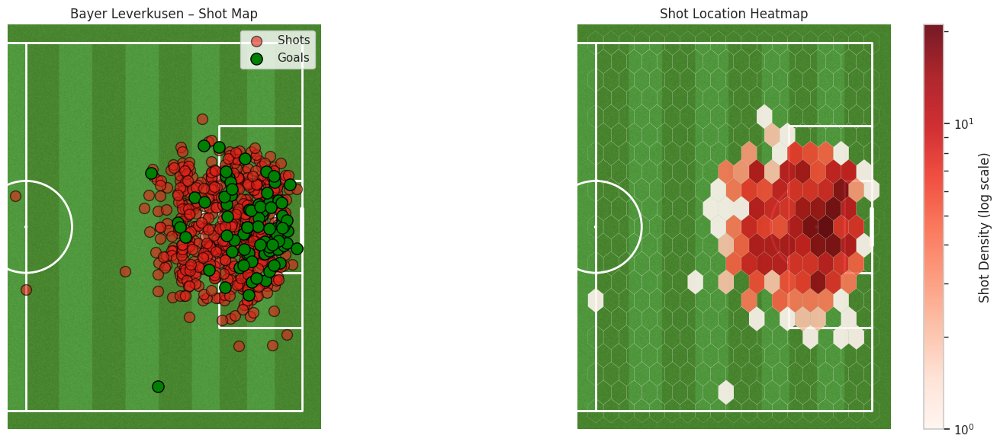

In [39]:
# Plot for shot map and heatmap
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Half pitch with direction arrows
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white',stripe = True, half=True)  # Only half pitch
pitch.draw(ax=axs[0])

# Plot shots
pitch.scatter(x, y, ax=axs[0], color='#E32219', edgecolor='black', s=100, alpha=0.6, label='Shots')

# Overlay goals
bl_goals = bl_shots[bl_shots['shot_outcome'] == 'Goal']
gx = bl_goals['location'].apply(lambda loc: loc[0])
gy = bl_goals['location'].apply(lambda loc: loc[1])
pitch.scatter(gx, gy, ax=axs[0], color='green', edgecolor='black', s=120, label='Goals')

axs[0].set_title('Bayer Leverkusen – Shot Map')
axs[0].legend(loc='upper right')

# Heatmap
heat_pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white',stripe=True, half=True)
heat_pitch.draw(ax=axs[1])

hb = axs[1].hexbin(x, y, gridsize=18, extent=(60, 120, 0, 80), cmap='Reds', bins='log', edgecolors='white', linewidths=0.1, alpha=0.9)

# Color bar
cbar = plt.colorbar(hb, ax=axs[1])
cbar.set_label('Shot Density (log scale)')

axs[1].set_title('Shot Location Heatmap')

plt.tight_layout()
plt.show()

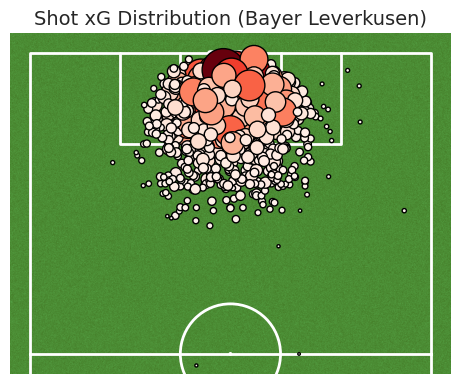

In [60]:
# Plotting shot xG distribution

pitch = VerticalPitch(pitch_type='statsbomb', pitch_color='grass', half = True,line_color='white')
fig, ax = pitch.draw(figsize=(6, 4))

# Size by xG
pitch.scatter(
    x=bl_shots['location'].apply(lambda x: x[0]),
    y=bl_shots['location'].apply(lambda x: x[1]),
    s=bl_shots['shot_statsbomb_xg'] * 1000,
    c=bl_shots['shot_statsbomb_xg'],
    cmap='Reds',
    edgecolors='black',
    ax=ax
)

ax.set_title("Shot xG Distribution (Bayer Leverkusen)", fontsize=14)
plt.show()


<ipython-input-61-94b735cb6035>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns_bar = sns.barplot(x=bl_goal_patterns.index, y=bl_goal_patterns.values, palette='Reds')


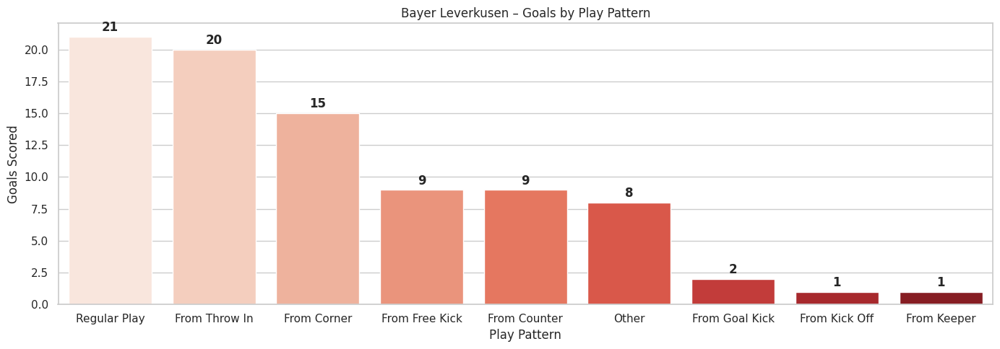

In [61]:
# Play pattern breakdown
bl_goal_patterns = bl_goals['play_pattern'].value_counts()

# Plot bar chart
plt.figure(figsize=(14, 5))
sns_bar = sns.barplot(x=bl_goal_patterns.index, y=bl_goal_patterns.values, palette='Reds')

# Add value labels on top of bars
for i, value in enumerate(bl_goal_patterns.values):
    plt.text(i, value + 0.2, str(value), ha='center', va='bottom', fontweight='bold')

plt.title("Bayer Leverkusen – Goals by Play Pattern")
plt.ylabel("Goals Scored")
plt.xlabel("Play Pattern")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


### 4.2. Top Goalscorers

In [42]:
# Top scorers
top_scorers = bl_goals['player'].value_counts()

top_scorers

,count
player,
Victor Okoh Boniface,14
Florian Wirtz,11
Alejandro Grimaldo García,10
Jeremie Frimpong,9
Patrik Schick,7
Nathan Tella,5
Amine Adli,4
Exequiel Alejandro Palacios,4
Jonathan Tah,4


### 4.2. Top Assists

In [43]:
# Loop through each match
bl_events = pd.DataFrame(columns = events.columns )
for _, match in bl_matches.iterrows():
    match_id = match['match_id']
    events = sb.events(match_id=match_id)
    bl_events = pd.concat([bl_events,events[(events['team'] == 'Bayer Leverkusen')]], ignore_index=True)

<ipython-input-43-6dee6e045bca>:6: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bl_events = pd.concat([bl_events,events[(events['team'] == 'Bayer Leverkusen')]], ignore_index=True)


In [44]:
# Assists
assists = bl_events[bl_events['pass_goal_assist'] == True]
top_assisters = assists['player'].value_counts()

print("🎯 Top Assisters:\n", top_assisters)

🎯 Top Assisters:
 player
Alejandro Grimaldo García         13
Florian Wirtz                     10
Victor Okoh Boniface               8
Jonas Hofmann                      7
Jeremie Frimpong                   7
Amine Adli                         5
Exequiel Alejandro Palacios        4
Robert Andrich                     2
Adam Hložek                        2
Arthur Augusto de Matos Soares     2
Nathan Tella                       2
Josip Stanišić                     1
Jonathan Tah                       1
Edmond Fayçal Tapsoba              1
Piero Martín Hincapié Reyna        1
Noah Mbamba                        1
Name: count, dtype: int64


### 4.3. Chance Creation and Dribbling

In [45]:
# Key Passes (Shot Assists)
key_passes = bl_events[bl_events['pass_shot_assist'] == True]
top_creators = key_passes['player'].value_counts().head(5)

print("Key Pass Creators:\n", top_creators)

Key Pass Creators:
 player
Jonas Hofmann                69
Alejandro Grimaldo García    63
Florian Wirtz                61
Granit Xhaka                 41
Jeremie Frimpong             36
Name: count, dtype: int64


In [46]:
# Dribbles completed
successful_dribbles = bl_events[(bl_events['type'] == 'Dribble') &
                             (bl_events['dribble_outcome'] == 'Complete')]
top_dribblers = successful_dribbles['player'].value_counts().head(5)

print("Top Dribblers:\n", top_dribblers)

Top Dribblers:
 player
Florian Wirtz                  69
Victor Okoh Boniface           46
Jeremie Frimpong               40
Exequiel Alejandro Palacios    20
Alejandro Grimaldo García      20
Name: count, dtype: int64


### 4.4. G+A Player Analysis

In [47]:
g_plus_a = pd.merge(top_assisters.reset_index(), top_scorers.reset_index(), on='player', how='outer')
g_plus_a.columns = ['player', 'assists', 'goals']

In [48]:
g_plus_a = g_plus_a.fillna(0)
g_plus_a['G+A'] = g_plus_a['goals'] + g_plus_a['assists']

In [49]:
g_plus_a = g_plus_a.sort_values(by='G+A', ascending = False).reset_index(drop=True)

In [50]:
g_plus_a.head()

,player,assists,goals,G+A
0,Alejandro Grimaldo García,13.0,10.0,23.0
1,Victor Okoh Boniface,8.0,14.0,22.0
2,Florian Wirtz,10.0,11.0,21.0
3,Jeremie Frimpong,7.0,9.0,16.0
4,Jonas Hofmann,7.0,4.0,11.0


Alejandro Garcia, Victor Boniface and Florian Wirtz are the players with the highest G+A with Alejandro Garcia having maximum assists (13) and Victor Boniface being the top scorer with 14 goals.

## 5. The Last Minute Goals!

Bayer Leverkusen avoided defeat in so many games by scoring an equalizer in the last minute and managed to keep their unbeaten streak. We will do a time-series analysis of all the goals scored.

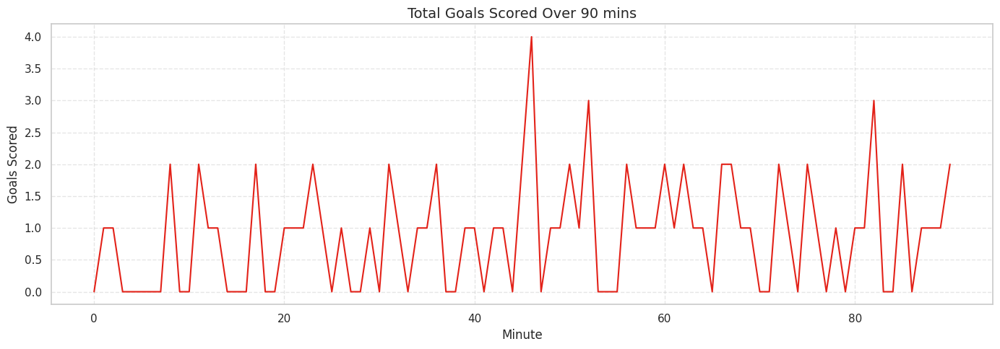

In [51]:
# Aggregate goals_for across all formations per minute
goals_over_time = timeline_df.groupby('minute')['goals_for'].sum().reset_index()

# Plot
plt.figure(figsize=(14, 5))
sns.lineplot(data=goals_over_time, x='minute', y='goals_for', color=bayer_red)

plt.title('Total Goals Scored Over 90 mins', fontsize=14)
plt.xlabel('Minute')
plt.ylabel('Goals Scored')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


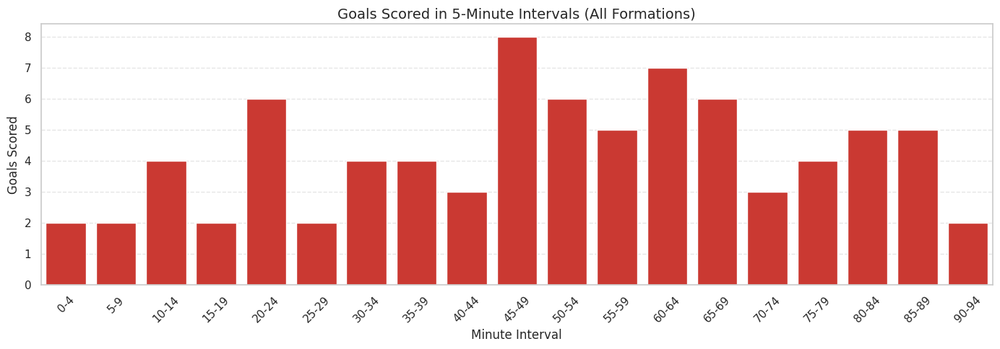

In [52]:
# Bin minutes into 5-minute intervals
timeline_df['minute_bin'] = (timeline_df['minute'] // 5) * 5

# Aggregate goals_for by these 5-minute bins
binned_goals = timeline_df.groupby('minute_bin')['goals_for'].sum().reset_index()

# Create proper bin labels like '0-4', '5-9', ...
bin_labels = [f"{m}-{m+4}" for m in binned_goals['minute_bin']]

# Plot histogram
plt.figure(figsize=(14, 5))
sns.barplot(data=binned_goals, x='minute_bin', y='goals_for', color=bayer_red)

plt.title('Goals Scored in 5-Minute Intervals (All Formations)', fontsize=14)
plt.xlabel('Minute Interval')
plt.ylabel('Goals Scored')
plt.xticks(ticks=range(len(bin_labels)), labels=bin_labels, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
